In [1]:
import pandas as pd
import torch
import os
import csv

from visualizer import get_local
get_local.activate()
import numpy as np
from helpers import *
from layers import *
from constants import *
from ViT import *
from trace_utils import *
from ResMLP import *
from ResNet import *
import torch
import torchvision
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
import gradcam
ViT = VisionTransformer(representation_size = None, patch_size= 16, embed_dim= 768, depth = 12, num_heads= 12)
#_load_weights(ViT, './ViT.npz')
#print(len(ViT))
ViT.load_state_dict(torch.load('./ViT.pth'))
#print(ViT)

config = resolve_data_config({}, model=ViT)
print('config:', config)
transform = create_transform(**config)
img = Image.open("./Sample.jpg")
tensor = transform(img).unsqueeze(0)
model = ViT
model.eval()
with torch.no_grad():
    out = model(tensor)

cache = get_local.cache
print(list(cache.keys()))


MlpMixer(
  (stem): PatchEmbed(
    (proj): Conv2d(3, 384, kernel_size=(16, 16), stride=(16, 16))
    (norm): Identity()
  )
  (blocks): Sequential(
    (0): ResBlock(
      (norm1): Affine()
      (linear_tokens): Linear(in_features=196, out_features=196, bias=True)
      (drop_path): Identity()
      (norm2): Affine()
      (mlp_channels): Mlp(
        (fc1): Linear(in_features=384, out_features=1536, bias=True)
        (act): GELU()
        (drop1): Dropout(p=0.0, inplace=False)
        (fc2): Linear(in_features=1536, out_features=384, bias=True)
        (drop2): Dropout(p=0.0, inplace=False)
      )
    )
    (1): ResBlock(
      (norm1): Affine()
      (linear_tokens): Linear(in_features=196, out_features=196, bias=True)
      (drop_path): Identity()
      (norm2): Affine()
      (mlp_channels): Mlp(
        (fc1): Linear(in_features=384, out_features=1536, bias=True)
        (act): GELU()
        (drop1): Dropout(p=0.0, inplace=False)
        (fc2): Linear(in_features=1536, out_f

In [2]:
embedding = ViT.returnPosEmbedding()
print(type(embedding))

<class 'torch.nn.parameter.Parameter'>


In [4]:

embedding = embedding.squeeze(0)
print(embedding.shape)

torch.Size([197, 768])


In [26]:
import torch
import torch.nn as nn
import math

     
def CosineSimilarity( tensor_1, tensor_2):
    normalized_tensor_1 = tensor_1 / tensor_1.norm(dim=-1, keepdim=True)
    normalized_tensor_2 = tensor_2 / tensor_2.norm(dim=-1, keepdim=True)
    return (normalized_tensor_1 * normalized_tensor_2).sum(dim=-1)
print(CosineSimilarity(embedding[1], embedding[2]).item())

0.8035567402839661


In [40]:
import matplotlib.pyplot as plt
def CalSimilarMatrix(tensorList, nowIndex, method):
    similarList = []
    for i in range(len(tensorList)):
        similarList.append(method(tensorList[i], tensorList[nowIndex]).item())
    arr = np.matrix(similarList)
    #np.expand_dims(arr, 1)
    #print(arr.shape)
    figure = plt.figure()
    arr = arr.reshape(14, 14)
    return arr
    #print(arr.shape)
    #plt.imshow(arr)
    #plt.show()
CalSimilarMatrix(embedding[1:], 0, CosineSimilarity)

matrix([[ 9.99999940e-01,  8.03556740e-01,  6.64478123e-01,
          5.92750072e-01,  5.58100343e-01,  4.73501354e-01,
          3.75305861e-01,  3.57443482e-01,  4.10640121e-01,
          4.36965287e-01,  4.26204801e-01,  4.25196737e-01,
          4.92896587e-01,  5.69280326e-01],
        [ 8.09709728e-01,  5.95330119e-01,  3.96477848e-01,
          3.53591353e-01,  3.03026706e-01,  2.24218264e-01,
          1.22526988e-01,  1.02061555e-01,  1.54280514e-01,
          1.79851770e-01,  1.71466976e-01,  1.42808765e-01,
          2.50599772e-01,  3.34397465e-01],
        [ 6.56784892e-01,  3.81820053e-01,  2.16850400e-01,
          1.50190070e-01,  1.16069704e-01,  1.29659437e-02,
         -7.10571259e-02, -8.49840268e-02, -3.70446071e-02,
         -1.19759962e-02, -2.93320902e-02, -3.68931144e-02,
          4.44766656e-02,  1.73602954e-01],
        [ 5.93073785e-01,  3.38937789e-01,  1.49597138e-01,
          9.10791382e-02,  5.04245907e-02, -3.55624631e-02,
         -1.32423848e-01, -1

<Figure size 432x288 with 0 Axes>

In [2]:
attention_maps = cache['Block.forward']
print('len(attention_maps):', len(attention_maps))

len(attention_maps): 12


In [3]:
def grid_show(to_shows, cols):
    rows = (len(to_shows)-1) // cols + 1
    it = iter(to_shows)
    fig, axs = plt.subplots(rows, cols, figsize=(rows*8.5, cols*2))
    for i in range(rows):
        for j in range(cols):
            try:
                image, title = next(it)
            except StopIteration:
                image = np.zeros_like(to_shows[0][0])
                title = 'pad'
            axs[i, j].imshow(image)
            axs[i, j].set_title(title)
            axs[i, j].set_yticks([])
            axs[i, j].set_xticks([])
    plt.show()

def visualize_head(att_map):
    ax = plt.gca()
    # Plot the heatmap
    im = ax.imshow(att_map)
    # Create colorbar
    cbar = ax.figure.colorbar(im, ax=ax)
    plt.show()
    
def visualize_heads(att_map, cols):
    to_shows = []
    att_map = att_map.squeeze()
    for i in range(att_map.shape[0]):
        to_shows.append((att_map[i], f'Head {i}'))
    average_att_map = att_map.mean(axis=0)
    to_shows.append((average_att_map, 'Head Average'))
    grid_show(to_shows, cols=cols)

def gray2rgb(image):
    return np.repeat(image[...,np.newaxis],3,2)
    
def cls_padding(image, mask, cls_weight, grid_size):
    if not isinstance(grid_size, tuple):
        grid_size = (grid_size, grid_size)
        
    image = np.array(image)

    H, W = image.shape[:2]
    delta_H = int(H/grid_size[0])
    delta_W = int(W/grid_size[1])
    
    padding_w = delta_W
    padding_h = H
    padding = np.ones_like(image) * 255
    padding = padding[:padding_h, :padding_w]
    
    padded_image = np.hstack((padding,image))
    padded_image = Image.fromarray(padded_image)
    draw = ImageDraw.Draw(padded_image)
    draw.text((int(delta_W/4),int(delta_H/4)),'CLS', fill=(0,0,0)) # PIL.Image.size = (W,H) not (H,W)

    mask = mask / max(np.max(mask),cls_weight)
    cls_weight = cls_weight / max(np.max(mask),cls_weight)
    
    if len(padding.shape) == 3:
        padding = padding[:,:,0]
        padding[:,:] = np.min(mask)
    mask_to_pad = np.ones((1,1)) * cls_weight
    mask_to_pad = Image.fromarray(mask_to_pad)
    mask_to_pad = mask_to_pad.resize((delta_W, delta_H))
    mask_to_pad = np.array(mask_to_pad)

    padding[:delta_H,  :delta_W] = mask_to_pad
    padded_mask = np.hstack((padding, mask))
    padded_mask = padded_mask
    
    meta_mask = np.zeros((padded_mask.shape[0], padded_mask.shape[1],4))
    meta_mask[delta_H:,0: delta_W, :] = 1 
    
    return padded_image, padded_mask, meta_mask
    

def visualize_grid_to_grid_with_cls(att_map, grid_index, image, grid_size=14, alpha=0.6):
    if not isinstance(grid_size, tuple):
        grid_size = (grid_size, grid_size)
    
    attention_map = att_map[grid_index]
    cls_weight = attention_map[0]
    
    mask = attention_map[1:].reshape(grid_size[0], grid_size[1])
    mask = Image.fromarray(mask).resize((image.size))
    
    padded_image ,padded_mask, meta_mask = cls_padding(image, mask, cls_weight, grid_size)
    
    if grid_index != 0: # adjust grid_index since we pad our image
        grid_index = grid_index + (grid_index-1) // grid_size[1]
        
    grid_image = highlight_grid(padded_image, [grid_index], (grid_size[0], grid_size[1]+1))
    
    fig, ax = plt.subplots(1, 2, figsize=(10,7))
    fig.tight_layout()
    
    ax[0].imshow(grid_image)
    ax[0].axis('off')
    
    ax[1].imshow(grid_image)
    ax[1].imshow(padded_mask, alpha=alpha, cmap='rainbow')
    ax[1].imshow(meta_mask)
    ax[1].axis('off')
    

def visualize_grid_to_grid(att_map, grid_index, image, grid_size=14, alpha=0.6):
    if not isinstance(grid_size, tuple):
        grid_size = (grid_size, grid_size)
    
    H,W = att_map.shape
    with_cls_token = False
      
    grid_image = highlight_grid(image, [grid_index], grid_size)
    
    mask = att_map[grid_index].reshape(grid_size[0], grid_size[1])
    mask = Image.fromarray(mask).resize((image.size))
    
    fig, ax = plt.subplots(1, 2, figsize=(10,7))
    fig.tight_layout()
    
    ax[0].imshow(grid_image)
    ax[0].axis('off')
    
    ax[1].imshow(grid_image)
    ax[1].imshow(mask/np.max(mask), alpha=alpha, cmap='rainbow')
    ax[1].axis('off')
    plt.show()
    
def highlight_grid(image, grid_indexes, grid_size=14):
    if not isinstance(grid_size, tuple):
        grid_size = (grid_size, grid_size)
    
    W, H = image.size
    h = H / grid_size[0]
    w = W / grid_size[1]
    image = image.copy()
    for grid_index in grid_indexes:
        x, y = np.unravel_index(grid_index, (grid_size[0], grid_size[1]))
        a= ImageDraw.ImageDraw(image)
        a.rectangle([(y*w,x*h),(y*w+w,x*h+h)],fill =None,outline ='red',width =2)
    return image

In [39]:
import torch
import torchvision.transforms as T
from timm.models.vision_transformer import vit_small_patch16_224
import json
from PIL import Image, ImageDraw
import numpy as np
import matplotlib.pyplot as plt

In [5]:
print(len(attention_maps))

12


In [6]:
print(len(attention_maps))

12


In [7]:
print(attention_maps[0].shape)
type(attention_maps[0])

(1, 197, 768)


numpy.ndarray

In [42]:
import seaborn

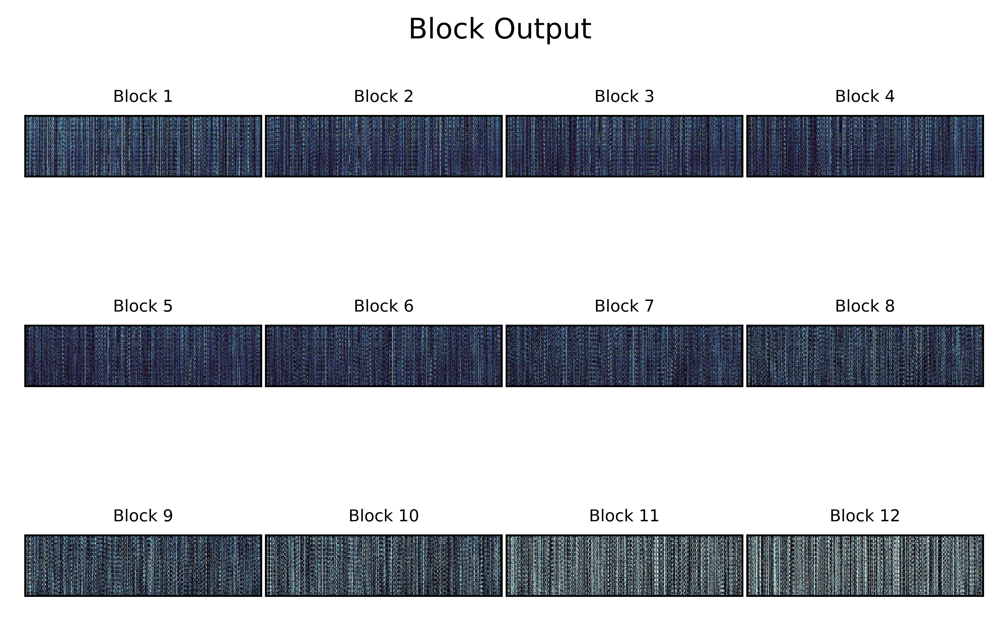

In [29]:

plt.rcParams['figure.dpi'] = 1200
figure = plt.figure()
axes = [figure.add_subplot(3, 4, i + 1, xticks = [], yticks = [] , autoscale_on = True) for i in range(12)]
ims = [None for _ in range(12)]

for i in range(12):
    thisLayer = attention_maps[i].squeeze(0)
        #print(returnMapTensor(i).max(), returnMapTensor(i).min())
    ims[i] = axes[i].imshow( thisLayer, vmin=-0.25, vmax=1, cmap ='mako')
    axes[i].set_title( 'Block ' + str(i + 1), fontsize = 7)
figure.suptitle('Block Output', y = 1)
#subplots_adjust(left=0.15,bottom=0.1,top=0.9,right=0.95,hspace=0.2,wspace=0.25)
#cb1 = figure.colorbar(ims[3])
plt.tight_layout(h_pad=0.02,w_pad=0.02)
plt.subplots_adjust( hspace=.01, wspace=.02)
plt.savefig('C:\\Users\\Dawson\\Desktop\\毕设\\ImageClassifier\\CompareModel\\ViT Attention\\Block Output' + '.jpg')
plt.show()        

In [81]:
plt.rcParams['figure.dpi'] = 1500

D:\Anaconda\envs\DL\lib\site-packages\ipykernel_launcher.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  if __name__ == '__main__':


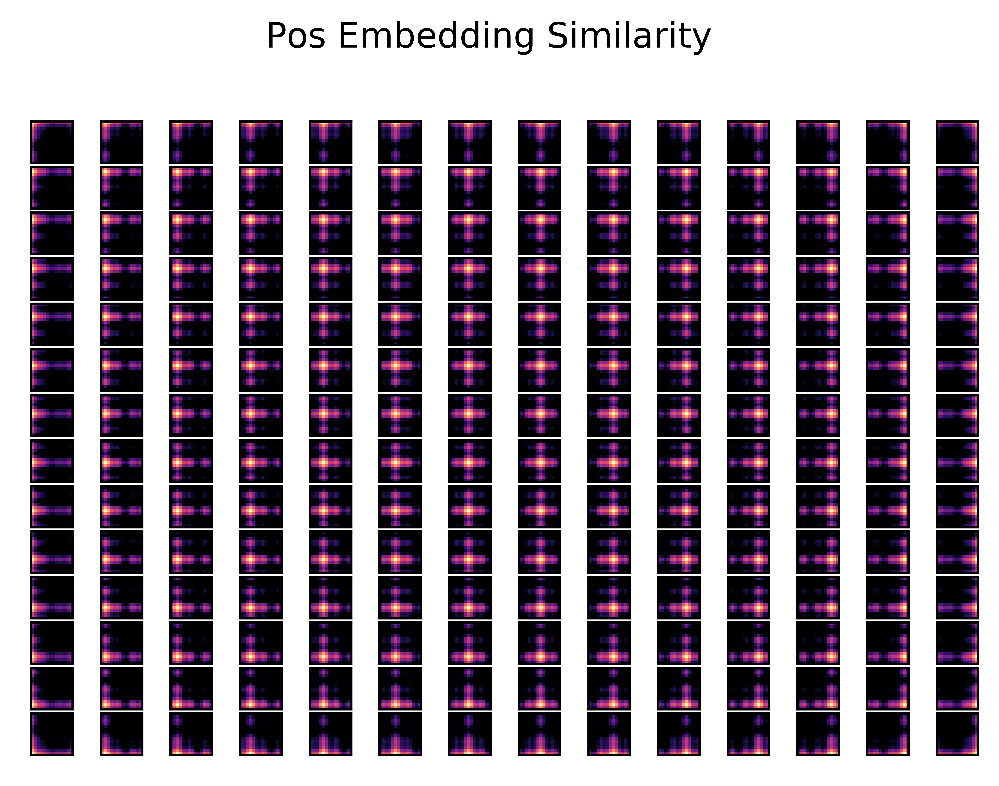

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

<Figure size 9000x6000 with 0 Axes>

In [82]:


figure = plt.figure()
axes = [figure.add_subplot(14, 14, i + 1, xticks = [], yticks = [] ) for i in range(196)]
ims = [None for _ in range(196)]

for i in range(196):
    thisLayer = CalSimilarMatrix(embedding[1:], i, CosineSimilarity)
        #print(returnMapTensor(i).max(), returnMapTensor(i).min())
    ims[i] = axes[i].imshow( thisLayer, vmin=-0., vmax=1, cmap ='magma')
    #axes[i].set_title( 'Pos ' + str(i + 1), fontsize = 7)
figure.suptitle('Pos Embedding Similarity', y = 1)
#subplots_adjust(left=0.15,bottom=0.1,top=0.9,right=0.95,hspace=0.2,wspace=0.25)
#cb1 = figure.colorbar(ims[3])
#plt.tight_layout(h_pad=0.02,w_pad=0.02)
#plt.tight_layout()
#plt.subplots_adjust(wspace=0, hspace=0)
#plt.subplots_adjust( wspace=100)

figure.subplots_adjust(wspace=0, hspace=0.1)
figure.savefig('C:\\Users\\Dawson\\Desktop\\毕设\\ImageClassifier\\CompareModel\\ViT Attention\\Pos Embedding' + '.jpg')
plt.show()        

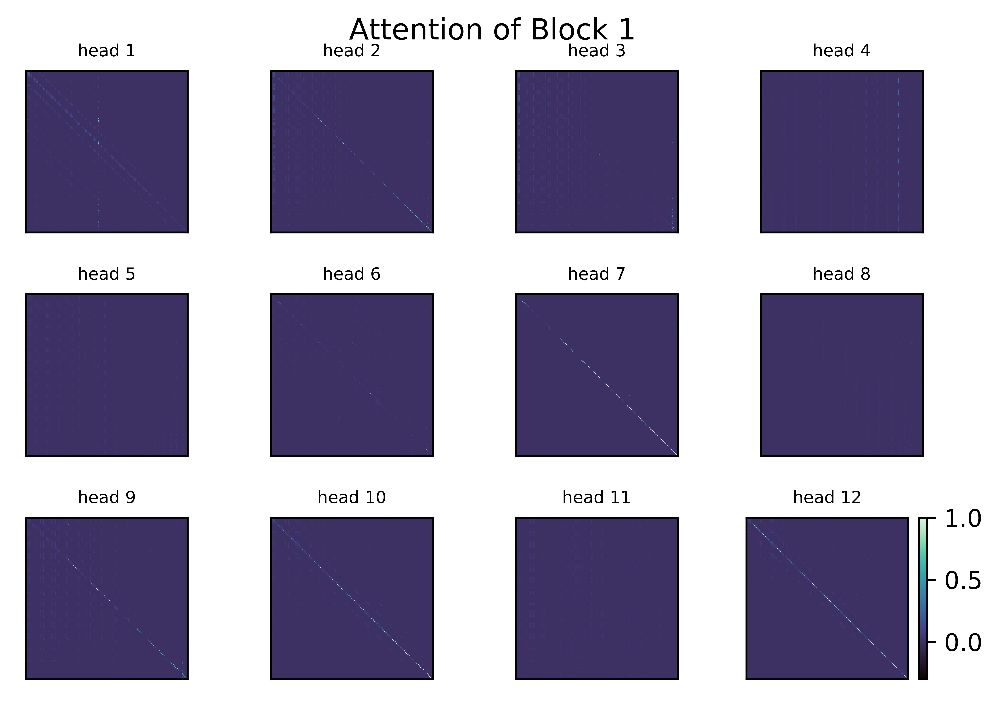

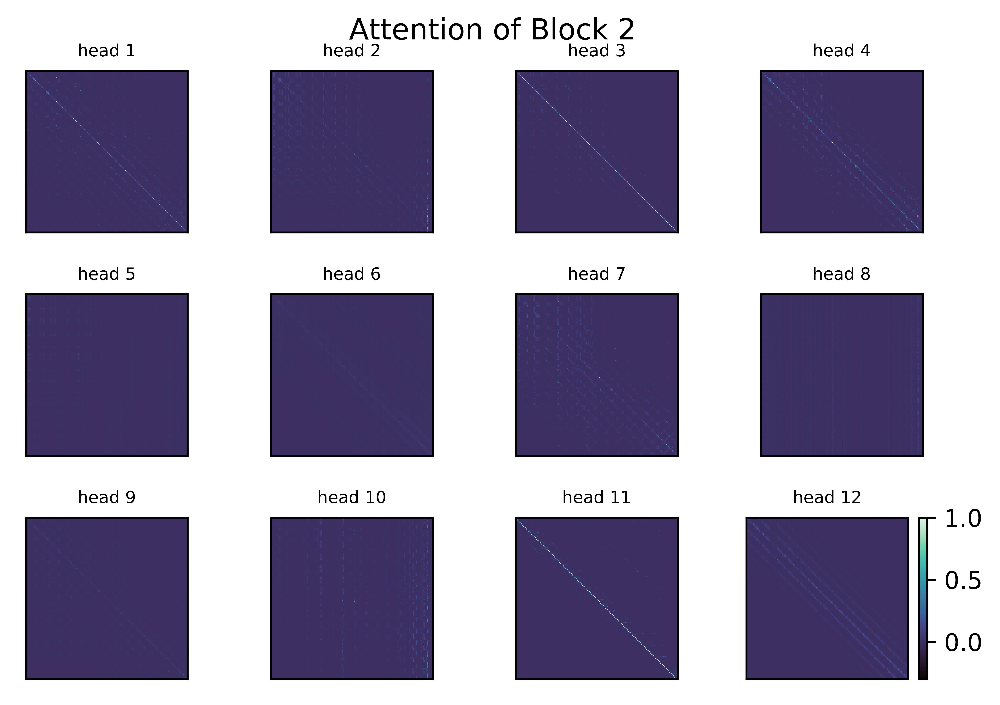

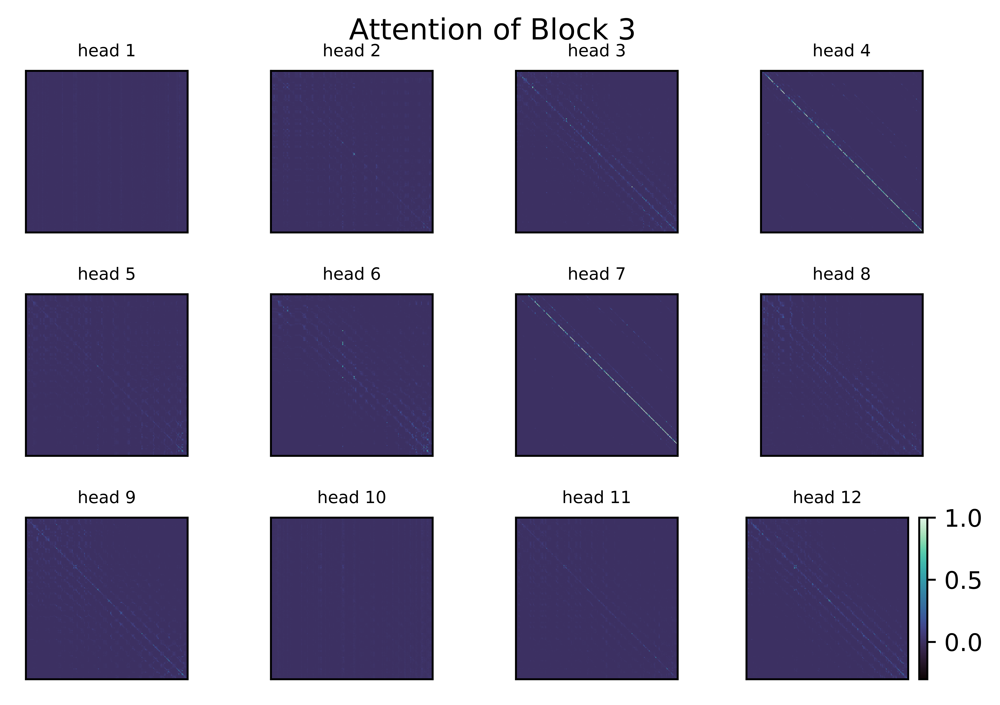

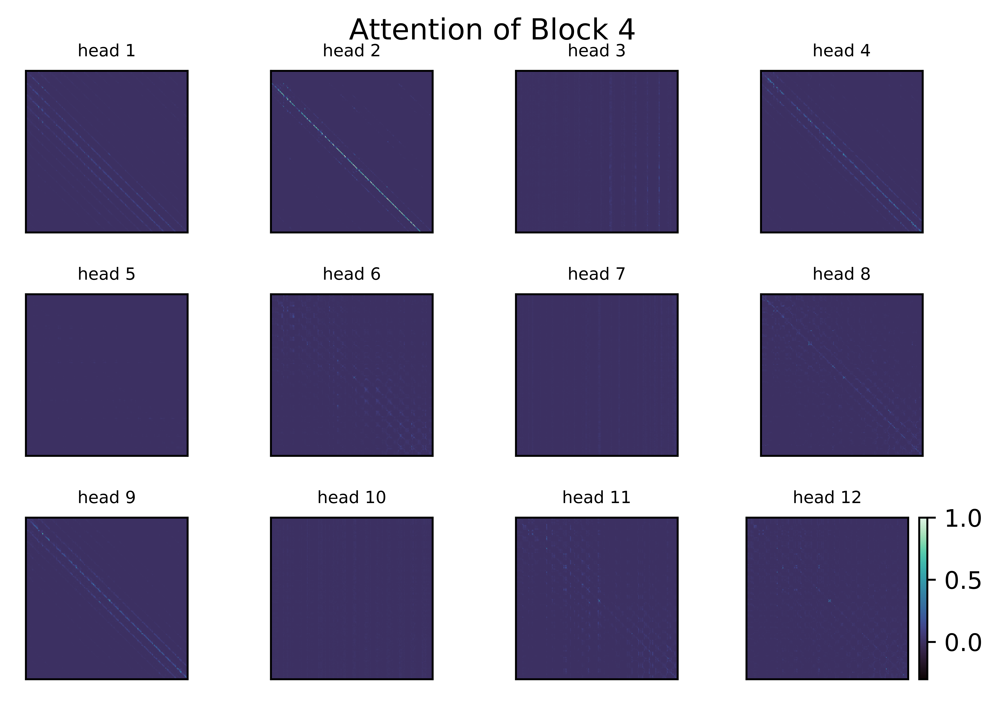

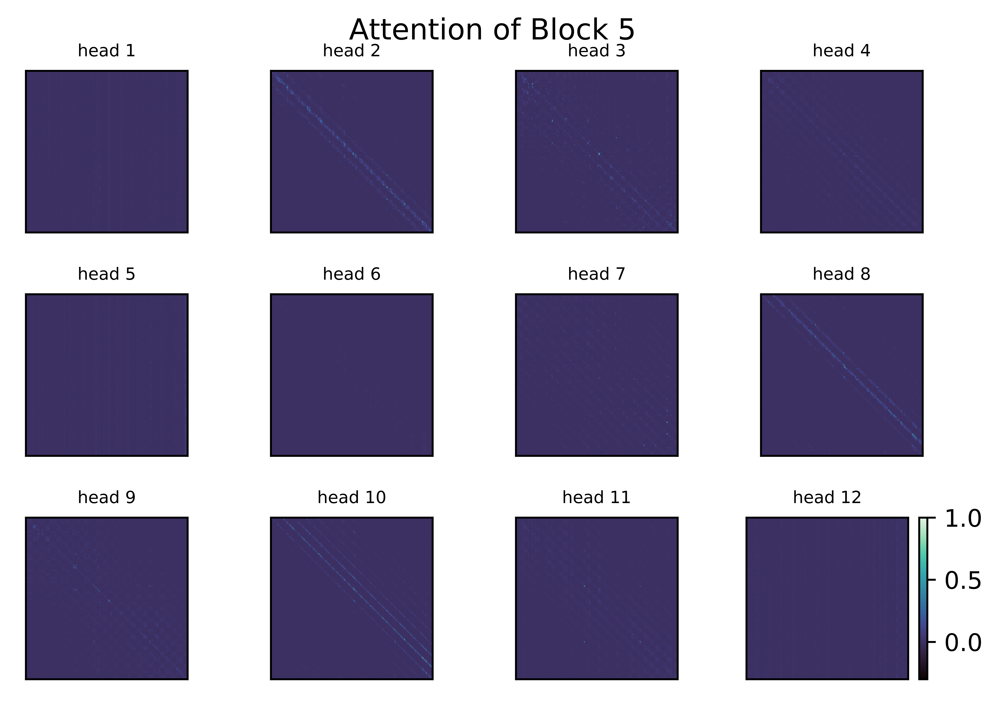

...

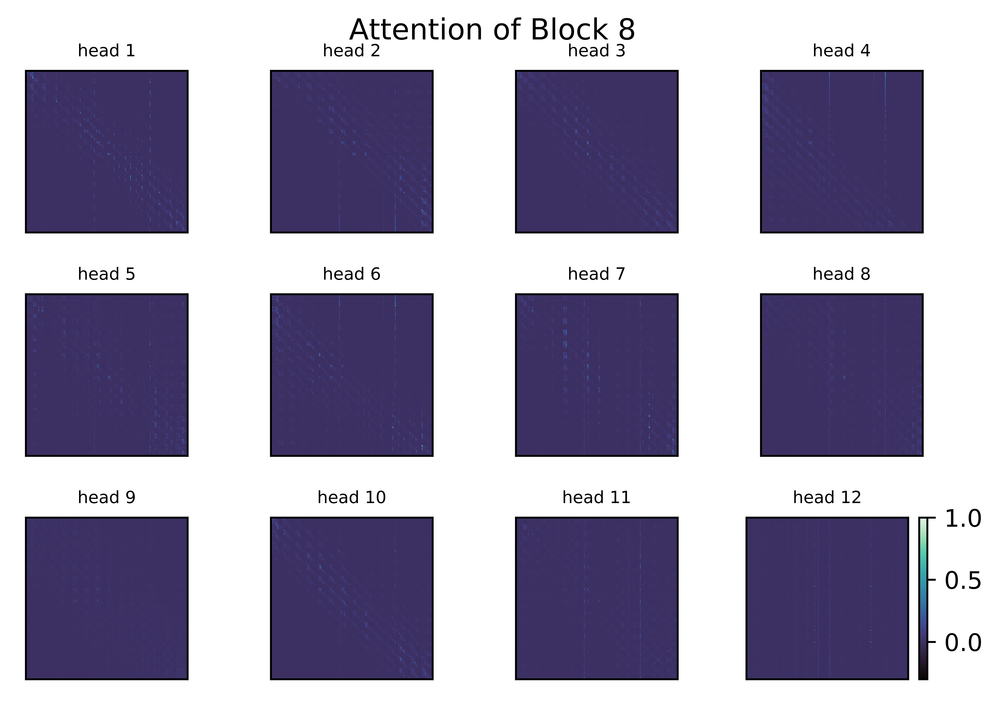

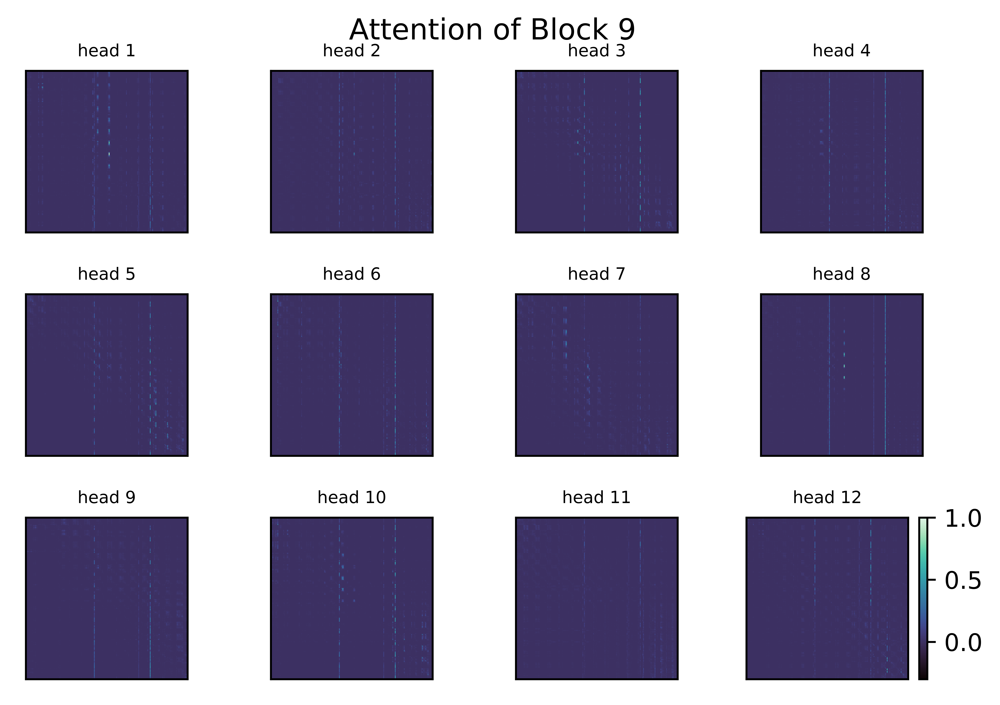

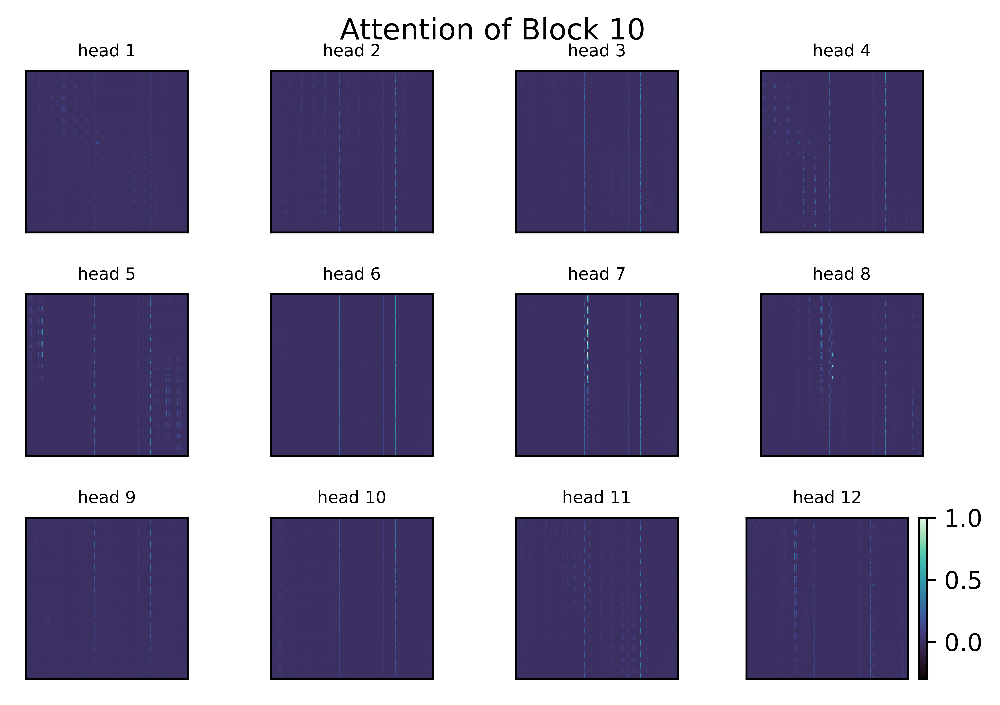

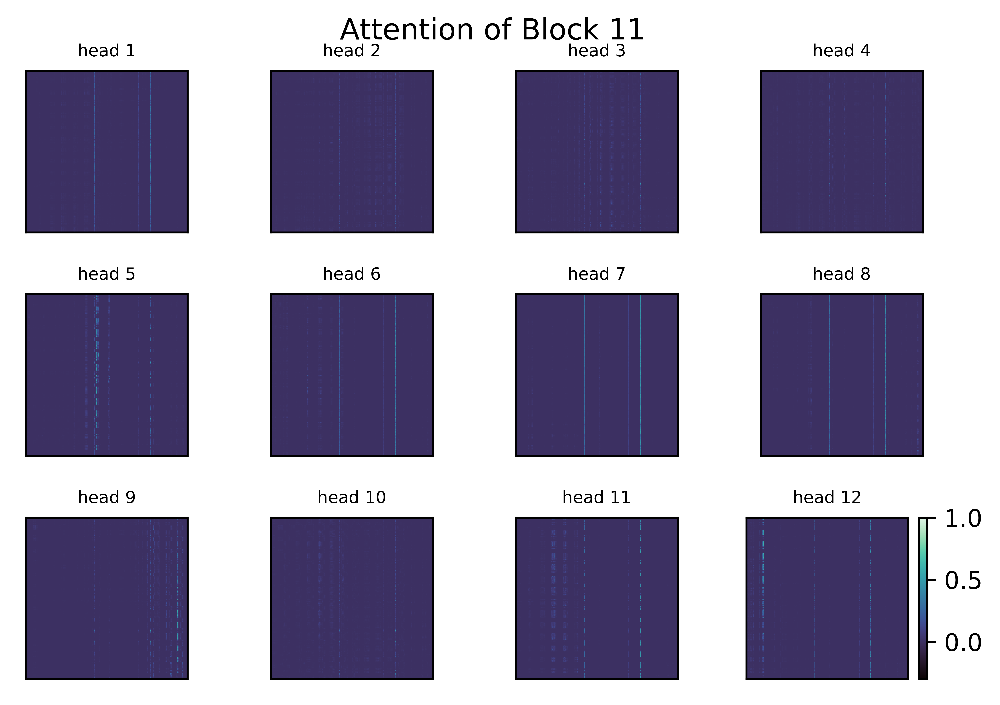

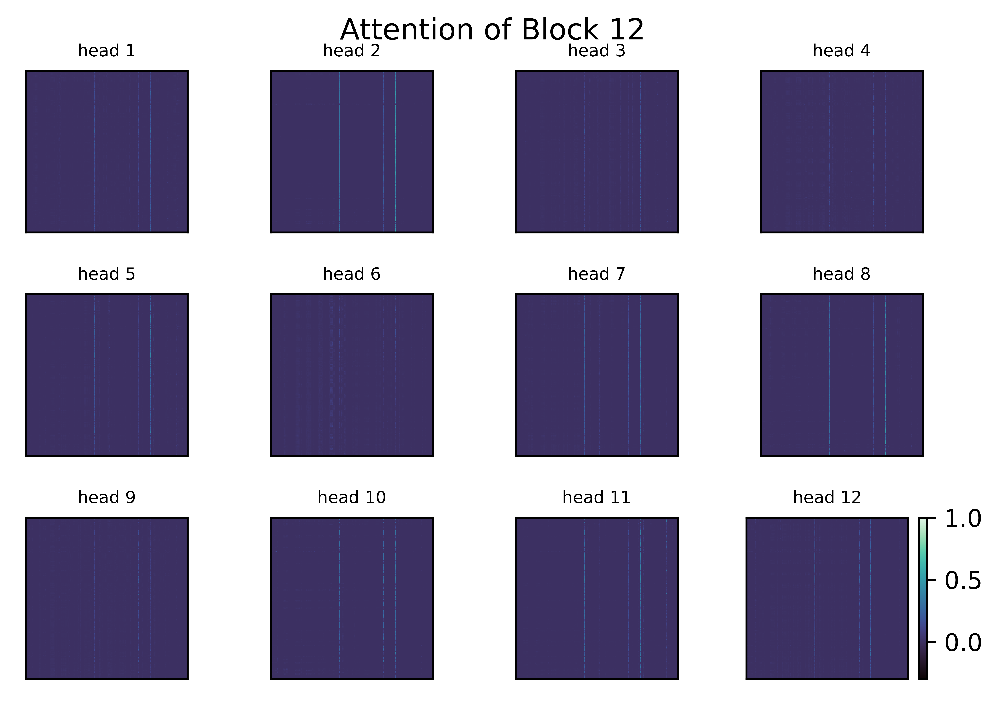

In [35]:
for layer in range(12):
    thisLayer = attention_maps[layer].squeeze(0)
    figure = plt.figure()
    axes = [figure.add_subplot(3, 4, i + 1, xticks = [], yticks = [] , autoscale_on = True) for i in range(12)]
    ims = [None for _ in range(12)]
    
    for i in range(12):
            #print(returnMapTensor(i).max(), returnMapTensor(i).min())
        ims[i] = axes[i].imshow( thisLayer[i], vmin=-0.3, vmax=1, cmap ='mako')
        axes[i].set_title( 'head ' + str(i + 1), fontsize = 7)
    figure.suptitle('Attention of Block ' + str(layer + 1), y = 1)
    #subplots_adjust(left=0.15,bottom=0.1,top=0.9,right=0.95,hspace=0.2,wspace=0.25)
    cb1 = figure.colorbar(ims[0],  shrink = 1,orientation = 'vertical')
    plt.tight_layout()
    #plt.subplots_adjust(bottom=.05, top=.95, hspace=.1)
    plt.savefig('C:\\Users\\Dawson\\Desktop\\毕设\\ImageClassifier\\CompareModel\\ViT Attention\\layer_' + str(layer + 1) + '.jpg')
    #plt.show()        

In [ ]:
plt.rcParams['figure.dpi'] = 600
for layer in range(36):
    figure = plt.figure()
    axes = [figure.add_subplot(3, 4, i + 1, xticks = [], yticks = [] , autoscale_on = True) for i in range(12)]
    ims = [None for _ in range(12)]
    for i in range(12):
        #print(returnMapTensor(i).max(), returnMapTensor(i).min())
        ims[i] = axes[i].imshow( returnMapTensor(i, layer), cmap='mako', vmin=-0.15, vmax=1)
        axes[i].set_title( 'head ' + str(i + 1), fontsize = 7, y = -0.2)
    #cax = figure.subplots(gridspec_kw={"width_ratios":[1,1, 0.05]})
    #figure.colorbar(cax)
    #add_colorbar(axes[0])
    #plt.title('Head Attention of ViT Layer 0',y=-0.4, x = -0.2 )
    figure.suptitle('Attention of layer ' + str(layer), y = 1)
    cb1 = figure.colorbar(ims[11],  shrink = 1,orientation = 'vertical')
    plt.tight_layout()    
    
    
    plt.savefig('./ViTAttentions/' + str(layer) + '.jpg')
    plt.show()

